In [1]:
from IPython.core.display import display, HTML
display(HTML('<style>.container {width:100% !important;}</style>'))
display(HTML('<style>.output_result { max-width:100%. !importang;}</style>'))
from pyspark.sql import SparkSession
from pyspark.sql import functions as sf
from pyspark.sql.types import IntegerType, StructField, StructType, StringType, FloatType, DecimalType
from shapely.geometry import Point, shape, Polygon
import geopandas
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mlp
import warnings
import numpy as np
warnings.filterwarnings('ignore')

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
spark = SparkSession.builder.getOrCreate()
spark.conf.set('spark.sql.debug.maxToStringFields',1000)
myType = [StructField('Year', IntegerType(),True),
      StructField('Month', IntegerType(),True),
      StructField('DayofMonth', IntegerType(),True),
      StructField('DayOfWeek', IntegerType(),True),
      StructField('DepTime', IntegerType(),True),
      StructField('CRSDepTime', IntegerType(),True),
      StructField('ArrTime', IntegerType(),True),
      StructField('CRSArrTime', IntegerType(),True),
      StructField('UniqueCarrier', StringType(),True),
      StructField('FlightNum', IntegerType(),True),
      StructField('TailNum', StringType(),True),
      StructField('ActualElapsedTime', IntegerType(),True),
      StructField('CRSElapsedTime', IntegerType(),True),
      StructField('AirTime', IntegerType(),True),
      StructField('ArrDelay', IntegerType(),True),
      StructField('DepDelay', IntegerType(),True),
      StructField('Origin', StringType(),True),
      StructField('Dest', StringType(),True),
      StructField('Distance', IntegerType(),True),
      StructField('TaxiIn', IntegerType(),True),
      StructField('TaxiOut', IntegerType(),True),
      StructField('Cancelled', IntegerType(),True),
      StructField('CancellationCode', StringType(),True),
      StructField('Diverted', IntegerType(),True),
      StructField('CarrierDelay', IntegerType(),True),
      StructField('WeatherDelay', IntegerType(),True),
      StructField('NASDelay', IntegerType(),True),
      StructField('SecurityDelay', IntegerType(),True),
      StructField('LateAircraftDelay', IntegerType(),True),
]
struct = StructType(fields=myType)
df = spark.read.option('header',True).csv('/BigData/BigData/HW2/', schema=struct)
df = df.dropna(thresh=1, subset=['Origin', 'Dest'])
years = [i for i in range(2000, 2009)]

Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
22/04/05 03:57:17 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
#select data Year == 2007, col=ArrDelay, DepDelay
q1 = df.filter(df.Year == 2007).select(df.Month, df.ArrDelay, df.DepDelay)
MaxArr = q1.groupby('Month').max('ArrDelay').withColumnRenamed('Month', 'MaxArrMonth')
MaxDep = q1.groupby('Month').max('DepDelay').withColumnRenamed('Month', 'MaxDepMonth')
MinArr = q1.groupby('Month').min('ArrDelay').withColumnRenamed('Month', 'MinArrMonth')
MinDep = q1.groupby('Month').min('DepDelay').withColumnRenamed('Month', 'MinDepMonth')
q1 = MaxArr.join(MaxDep, MaxArr.MaxArrMonth==MaxDep.MaxDepMonth).drop('MaxDepMonth')
q1 = q1.join(MinArr, q1.MaxArrMonth==MinArr.MinArrMonth).drop('MinArrMonth')
q1 = q1.join(MinDep, q1.MaxArrMonth==MinDep.MinDepMonth).drop('MinDepMonth').withColumnRenamed('MaxArrMonth','Month').sort('Month')

q1.show()
q1_pds = q1.toPandas()

+-----+-------------+-------------+-------------+-------------+
|Month|max(ArrDelay)|max(DepDelay)|min(ArrDelay)|min(DepDelay)|
+-----+-------------+-------------+-------------+-------------+
|    1|         1426|         1406|         -312|         -305|
|    2|         1359|         1340|          -80|          -65|
|    3|         1564|         1547|         -132|         -124|
|    4|         1402|         1415|         -116|         -111|
|    5|         1429|         1416|         -162|         -165|
|    6|         1351|         1360|          -83|         -137|
|    7|         1386|         1369|         -175|         -165|
|    8|         1472|         1449|          -73|          -87|
|    9|         1665|         1689|          -89|          -97|
|   10|         2598|         2601|          -76|         -168|
|   11|         1146|         1137|          -86|         -169|
|   12|         1942|         1956|          -75|          -64|
+-----+-------------+-------------+-----

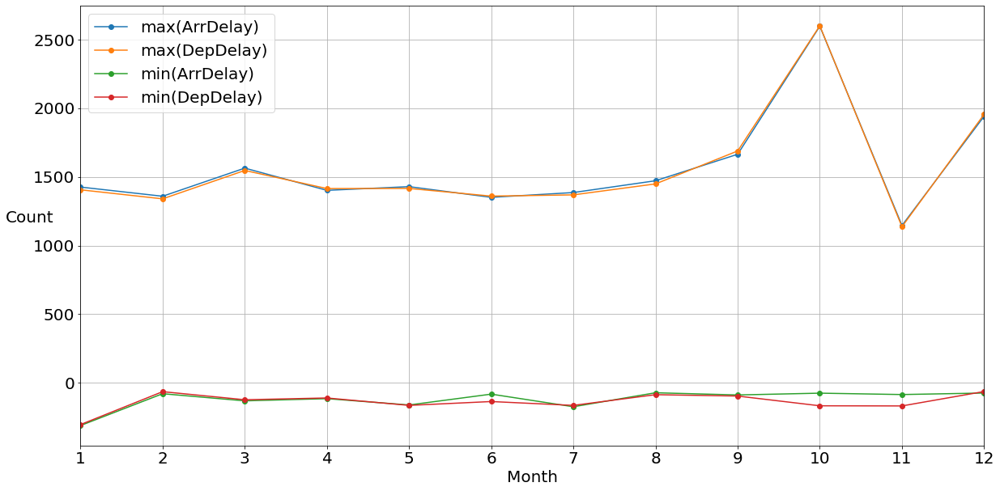

In [4]:
ax = q1_pds.plot(x='Month', grid=True, style='-o',figsize=(20,10))
ax.set_ylabel('Count', fontsize=20, rotation=0)
ax.set_xlabel('Month', fontsize=20, rotation=0)
ax.xaxis.set_major_locator(plt.MultipleLocator(1))
plt.xlim(1,12)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)
plt.show()

In [5]:
Y07 = df.filter(df.Year==2007)
Y07.join(q1, Y07.ArrDelay==q1['max(ArrDelay)']).select(Y07.ArrDelay, Y07.DepDelay, q1['max(ArrDelay)'], q1['max(DepDelay)']).show()
Y07.join(q1, Y07.ArrDelay==q1['min(ArrDelay)']).select(Y07.ArrDelay, Y07.DepDelay, q1['min(ArrDelay)'], q1['min(DepDelay)']).show()

+--------+--------+-------------+-------------+
|ArrDelay|DepDelay|max(ArrDelay)|max(DepDelay)|
+--------+--------+-------------+-------------+
|    1426|    1406|         1426|         1406|
|    1564|    1547|         1564|         1547|
|    1942|    1956|         1942|         1956|
|    1146|    1137|         1146|         1137|
|    1665|    1689|         1665|         1689|
|    1351|    1360|         1351|         1360|
|    1386|    1369|         1386|         1369|
|    2598|    2601|         2598|         2601|
|    1472|    1449|         1472|         1449|
|    1402|    1415|         1402|         1415|
|    1359|    1340|         1359|         1340|
|    1429|    1416|         1429|         1416|
+--------+--------+-------------+-------------+



+--------+--------+-------------+-------------+
|ArrDelay|DepDelay|min(ArrDelay)|min(DepDelay)|
+--------+--------+-------------+-------------+
|     -73|      -7|          -73|          -87|
|     -73|      -5|          -73|          -87|
|     -73|     -53|          -73|          -87|
|     -73|     -10|          -73|          -87|
|     -73|      -4|          -73|          -87|
|     -73|      -7|          -73|          -87|
|     -73|      -8|          -73|          -87|
|     -73|       3|          -73|          -87|
|     -73|     -64|          -73|          -87|
|    -116|    -111|         -116|         -111|
|     -75|     -60|          -75|          -64|
|     -75|     -10|          -75|          -64|
|     -75|      -5|          -75|          -64|
|     -75|     -13|          -75|          -64|
|     -75|     -10|          -75|          -64|
|     -75|       0|          -75|          -64|
|     -75|     -10|          -75|          -64|
|     -86|      -5|          -86|       

+-----+------+
|Month| count|
+-----+------+
|    1|344800|
|    2|336105|
|    3|358697|
|    4|333027|
|    5|334850|
|    6|388918|
|    7|390856|
|    8|382263|
|    9|276893|
|   10|324434|
|   11|300760|
|   12|388954|
+-----+------+



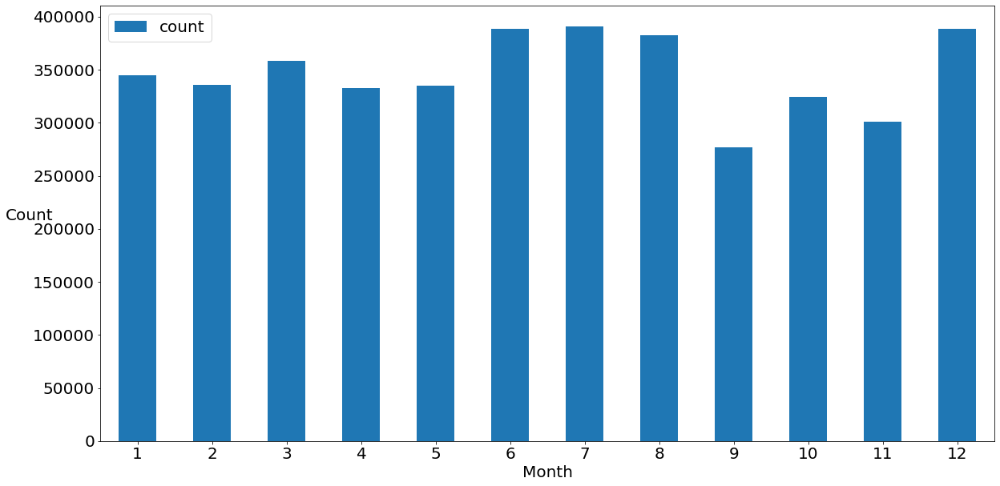

In [6]:
DelayCount = Y07.filter((Y07.ArrDelay>0)|(Y07.DepDelay>0))
DelayMonth = DelayCount.groupby('Month').count().sort('Month')
DelayMonth.show()
DelayMonthPds = DelayMonth.toPandas()
ax = DelayMonthPds.plot.bar(x='Month', y='count',figsize=(20,10))
ax.set_ylabel('Count', fontsize=20, rotation=0)
ax.set_xlabel('Month', fontsize=20, rotation=0)
ax.xaxis.set_major_locator(plt.MultipleLocator(1))
plt.xticks(fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)
plt.show()

+-----+------+------+------+------+------+------+------+------+
|Month|  2000|  2001|  2002|  2003|  2004|  2005|  2007|  2008|
+-----+------+------+------+------+------+------+------+------+
|    1|253026|284539|216849|235772|296376|319424|344800|334398|
|    2|245798|265087|187636|236719|279158|272900|336105|331328|
|    3|270689|293522|242930|236975|280832|320950|358697|354382|
|    4|263888|261844|209621|199331|266203|262404|333027|309338|
|    5|267893|253673|209685|220263|286088|270261|334850|309931|
|    6|302088|284993|230583|248808|329523|323210|388918|352280|
|    7|295722|284822|234380|268258|325680|351917|390856|325719|
|    8|301796|291323|217963|266025|305948|327288|382263|301709|
|    9|240878|170554|153327|197453|226325|248345|276893|214867|
|   10|270673|212978|199961|224061|296330|276571|324434|235986|
|   11|281362|206582|180296|251704|290523|279864|300760|227942|
|   12|307700|236270|222711|298060|343264|341668|388954|333598|
+-----+------+------+------+------+-----

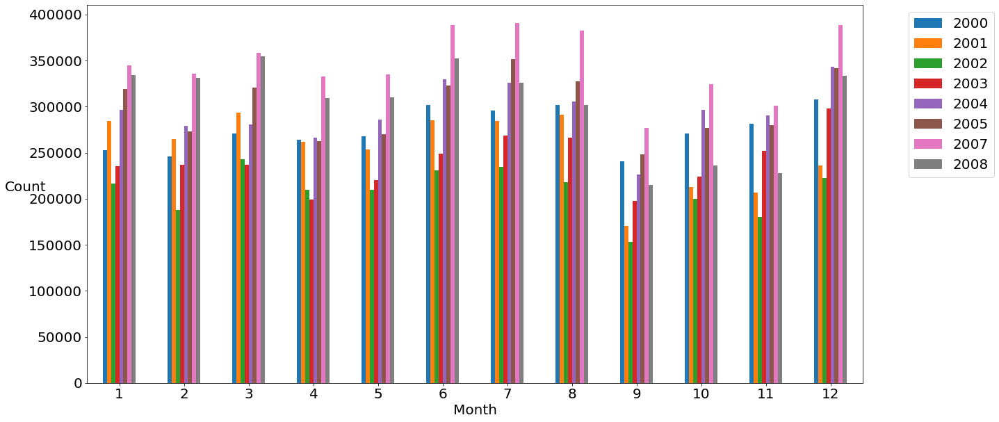

In [7]:
delay = df.filter((df.ArrDelay>0)|(df.DepDelay>0))
stastic = []

for y in years:
    new = delay.filter(delay.Year==y)
    if new.count() > 0:
        stastic.append(new.groupby('Month').count().withColumnRenamed('count', str(y)))
MonthDelay = stastic[0]
for s in stastic[1:]:
    MonthDelay = MonthDelay.join(s, on='Month', how='inner')
MonthDelay = MonthDelay.sort('Month')
MonthDelay.show()
MonthDelayPds = MonthDelay.toPandas()
ax = MonthDelayPds.plot.bar(x='Month', figsize=(20,10))
ax.set_ylabel('Count', fontsize=20, rotation=0)
ax.set_xlabel('Month', fontsize=20, rotation=0)
ax.xaxis.set_major_locator(plt.MultipleLocator(1))
plt.xticks(fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(fontsize=20,bbox_to_anchor=(1.05, 1.0),loc='upper left')
plt.show()

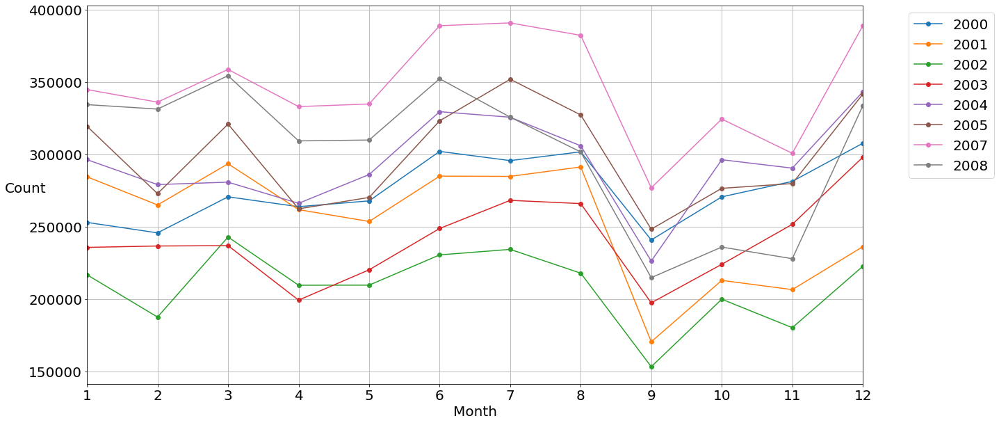

In [8]:
ax = MonthDelayPds.plot(x='Month', grid=True, style='-o', figsize=(20,10))
ax.set_ylabel('Count', fontsize=20, rotation=0)
ax.set_xlabel('Month', fontsize=20, rotation=0)
ax.xaxis.set_major_locator(plt.MultipleLocator(1))
plt.xlim(1,12)
plt.xticks(fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(fontsize=20,bbox_to_anchor=(1.05, 1.0),loc='upper left')
plt.show()

In [9]:
DList = ['CarrierDelay', 'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay']
FList = []
MonthDelay = delay.groupby('Month').count().withColumnRenamed('count', 'TotalDelay')

for d in DList:
    new = delay.filter(delay[d] > 0)
    if new.count() > 0:
        FList.append(new.groupby('Month').count().withColumnRenamed('count',d))

for f in FList:
    MonthDelay = MonthDelay.join(f, on='Month', how='inner')
MonthDelay = MonthDelay.sort('Month')
MonthDelay.show()

+-----+----------+------------+------------+--------+-------------+-----------------+
|Month|TotalDelay|CarrierDelay|WeatherDelay|NASDelay|SecurityDelay|LateAircraftDelay|
+-----+----------+------------+------------+--------+-------------+-----------------+
|    1|   2285184|      239112|       49454|  346607|         2831|           246251|
|    2|   2154731|      226431|       42733|  330864|         2459|           239524|
|    3|   2358977|      245371|       34386|  327961|         2876|           246401|
|    4|   2105656|      194359|       23874|  275619|         2026|           191513|
|    5|   2152644|      195116|       30917|  292469|         1977|           201247|
|    6|   2460403|      307479|       62855|  448567|         3818|           329566|
|    7|   2477354|      317951|       61516|  432371|         3664|           333906|
|    8|   2394315|      289846|       52174|  392354|         3353|           295670|
|    9|   1728642|      170664|       21357|  244739| 

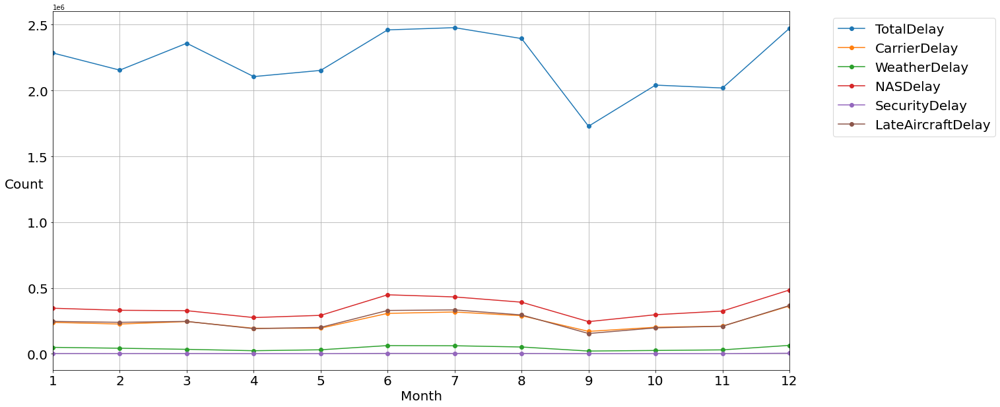

In [10]:
MonthDelayPds = MonthDelay.toPandas()
ax = MonthDelayPds.plot(x='Month', grid=True, style='-o', figsize=(20,10))
ax.set_ylabel('Count', fontsize=20, rotation=0)
ax.set_xlabel('Month', fontsize=20, rotation=0)
ax.xaxis.set_major_locator(plt.MultipleLocator(1))
plt.xlim(1,12)
plt.xticks(fontsize=20, rotation=0)
plt.yticks(fontsize=20)
plt.legend(fontsize=20,bbox_to_anchor=(1.05, 1.0),loc='upper left')
plt.show()

+-----+-------+-------+----------+
|Month|  Total|  Delay|Proportion|
+-----+-------+-------+----------+
|    1|4395097|2285184|    0.5199|
|    2|4056112|2154731|    0.5312|
|    3|4495552|2358977|    0.5247|
|    4|4333130|2105656|    0.4859|
|    5|4439838|2152644|    0.4848|
|    6|4412091|2460403|    0.5577|
|    7|4564541|2477354|    0.5427|
|    8|4579034|2394315|    0.5229|
|    9|4211978|1728642|    0.4104|
|   10|4317463|2040994|    0.4727|
|   11|4107001|2019033|    0.4916|
|   12|4231698|2472225|    0.5842|
+-----+-------+-------+----------+



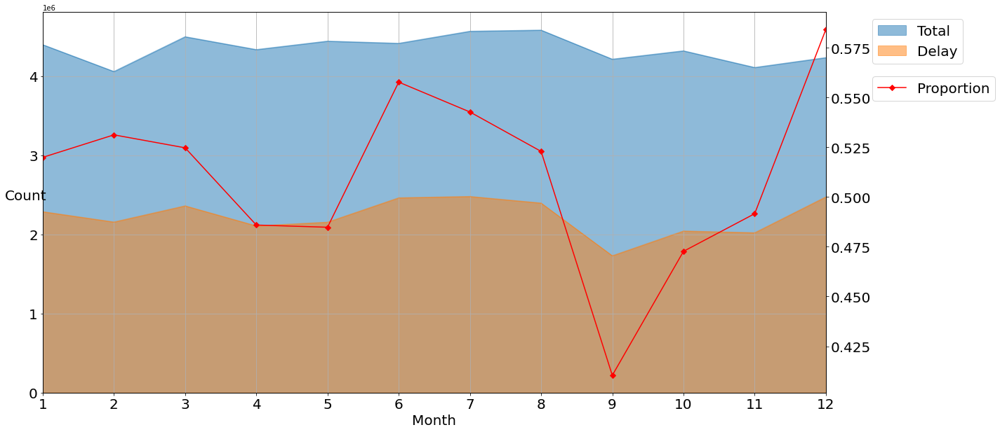

In [11]:
TotalFlight = df.groupby('Month').count().withColumnRenamed('count', 'Total')
MonthDelay = df.filter((df.ArrDelay>0)|(df.DepDelay>0)).groupby('Month').count().withColumnRenamed('count', 'Delay').withColumnRenamed('Month','MonthD')
TotalFlight = TotalFlight.join(MonthDelay, TotalFlight.Month==MonthDelay.MonthD).drop('MonthD').sort('Month')
TotalFlight = TotalFlight.withColumn('Proportion', sf.round(TotalFlight.Delay/TotalFlight.Total,4))
TotalFlight.show()
TotalFlightPds = TotalFlight.toPandas()
ax = TotalFlightPds.plot.area(x='Month', y=['Total', 'Delay'],grid=True,stacked=False, figsize=(20,10))
ax2 = ax.twinx()
TotalFlightPds.plot(ax=ax2, x='Month', y='Proportion', grid=False, style='-D', color='Red',figsize=(20,10))
ax.set_ylabel('Count', fontsize=20, rotation=0)
ax.set_xlabel('Month', fontsize=20, rotation=0)
ax.xaxis.set_major_locator(plt.MultipleLocator(1))
ax2.tick_params(axis='y', labelsize=20)
ax.tick_params(labelsize=20)
plt.xlim(1,12)

ax.legend(fontsize=20,bbox_to_anchor=(1.05, 1.0),loc='upper left')
ax2.legend(fontsize=20,bbox_to_anchor=(1.05, 0.85),loc='upper left')
plt.show()

In [12]:
q2 = df.filter((df.Year >= 2000) & (df.Year <= 2005)).filter(df.SecurityDelay > 0)
q2.groupby('Year').count().show()
display(q2.count())

+----+-----+
|Year|count|
+----+-----+
|2005| 6627|
|2004| 8158|
|2003| 3740|
+----+-----+



18525

In [13]:


eq2 = df.filter(df.SecurityDelay > 0)
Month = [i for i in range(1, 13)] 
stastic = []
for m in Month:
    new = eq2.filter(eq2.Month==m)
    if new.count() > 0:
        a = new.groupby('Year').count().withColumnRenamed('count', str(m))
        stastic.append(a)
col = [str(i) for i in Month]
col.insert(0, 'Year')
stack = stastic[-1].withColumnRenamed('12','drop')
for s in stastic:
    stack = stack.join(s, on='Year', how='left').fillna(0).fillna('0')
stack = stack.select(col).sort('Year')

stack.show()

+----+---+---+---+---+---+----+----+---+---+---+---+----+
|Year|  1|  2|  3|  4|  5|   6|   7|  8|  9| 10| 11|  12|
+----+---+---+---+---+---+----+----+---+---+---+---+----+
|2003|  0|  0|  0|  0|  0| 820| 564|616|172|416|339| 813|
|2004|706|589|516|461|430| 793| 750|695|542|540|676|1460|
|2005|732|391|746|381|361| 532| 700|711|353|372|347|1001|
|2007|624|843|747|708|695|1082|1129|953|467|568|430|1023|
|2008|769|636|867|476|491| 591| 521|378|201|284|241| 747|
+----+---+---+---+---+---+----+----+---+---+---+---+----+



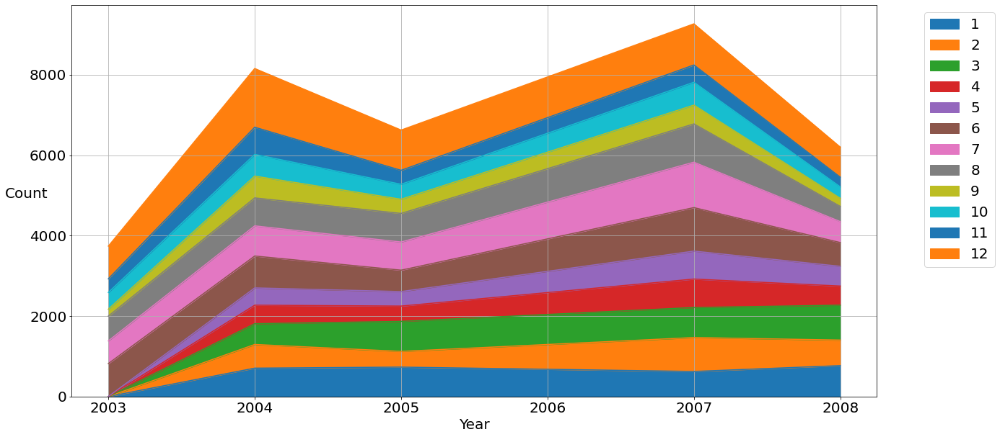

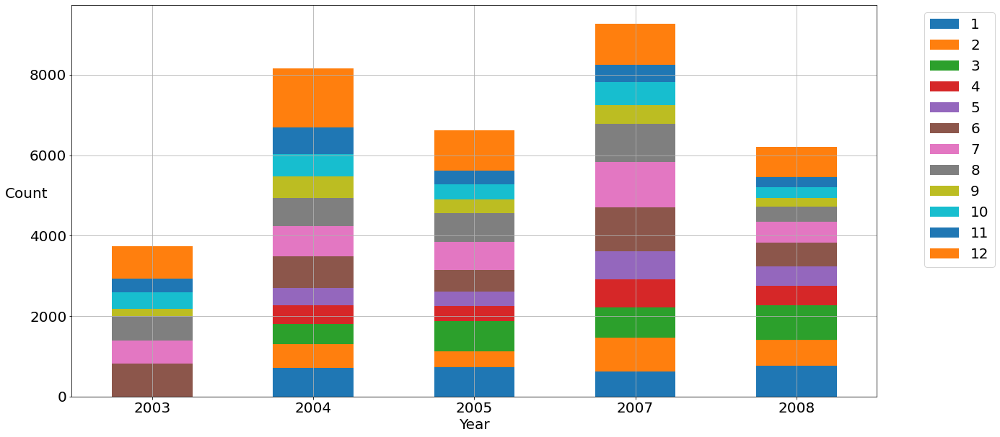

In [14]:
eq2Pds = stack.toPandas()

def set_ax(ax):
    ax.set_ylabel('Count', fontsize=20, rotation=0)
    ax.set_xlabel('Year', fontsize=20, rotation=0)
    ax.xaxis.set_major_locator(plt.MultipleLocator(1))
    ax.tick_params(labelsize=20, rotation=0)
    ax.legend(fontsize=20,bbox_to_anchor=(1.05, 1.0),loc='upper left')

ax1 = eq2Pds.plot.area(x='Year',grid=True,stacked=True, figsize=(20,10))
set_ax(ax1)

ax2 = eq2Pds.plot.bar(x='Year',grid=True,stacked=True, figsize=(20,10))
set_ax(ax2)

plt.show()

In [15]:
q3A = df.filter((df.ArrDelay >0) & (df.Year == 2008) ).groupby('Dest').count().sort('count', ascending=False).withColumnRenamed('count', 'DestCount')
q3D = df.filter((df.DepDelay > 0) & (df.Year == 2008)).groupby('Origin').count().sort('count', ascending=False).withColumnRenamed('count', 'OriginCount')
q3 = q3D.join(q3A, q3A.Dest == q3D.Origin).drop('Dest').withColumnRenamed('Origin', 'Airport')
q3 = q3.withColumn('Total', q3.DestCount+q3.OriginCount)
q3.sort('Total', ascending=False).show(5)
q3.sort('Total', ascending=True).show(5)

+-------+-----------+---------+------+
|Airport|OriginCount|DestCount| Total|
+-------+-----------+---------+------+
|    ATL|     175017|   187243|362260|
|    ORD|     159427|   151871|311298|
|    DFW|     127749|   119817|247566|
|    DEN|     104414|   102681|207095|
|    LAX|      87258|    93508|180766|
+-------+-----------+---------+------+
only showing top 5 rows



+-------+-----------+---------+-----+
|Airport|OriginCount|DestCount|Total|
+-------+-----------+---------+-----+
|    TUP|          1|        2|    3|
|    PIR|          3|        4|    7|
|    BJI|          4|       12|   16|
|    INL|          1|       17|   18|
|    BLI|          9|       36|   45|
+-------+-----------+---------+-----+
only showing top 5 rows



In [16]:
# Get the latitude and longitude of airport in America.
mapping = q3.select('Airport')
myType = [StructField('iata', StringType(),True),
      StructField('airport', StringType(),True),
      StructField('city', StringType(),True),
      StructField('state', StringType(),True),
      StructField('country', StringType(),True),
      StructField('lat', FloatType(),True),
      StructField('long', FloatType(),True)
]
struct = StructType(fields=myType)
airport = spark.read.option('header',True).csv('./airports.csv', sep=',', schema=struct)
airport = airport.join(mapping, airport.iata == mapping.Airport)
airport_shp = airport.withColumn('geometry', sf.concat(sf.lit('POINT ('),sf.col('long'),sf.lit(' '), sf.col('lat'), sf.lit(')'))).drop('long', 'lat').toPandas()
display(airport_shp)

,iata,airport,city,state,country,Airport,geometry
0,BGM,Binghamton Regional,Binghamton,NY,USA,BGM,POINT (-75.979614 42.208485)
1,PSE,Mercedita,Ponce,PR,USA,PSE,POINT (-66.56301 18.008303)
2,MSY,New Orleans International,New Orleans,LA,USA,MSY,POINT (-90.258026 29.99339)
3,GEG,Spokane Intl,Spokane,WA,USA,GEG,POINT (-117.533844 47.619854)
4,BUR,Burbank-Glendale-Pasadena,Burbank,CA,USA,BUR,POINT (-118.3585 34.20062)
...,...,...,...,...,...,...,...
297,LMT,Klamath Falls International,Klamath Falls,OR,USA,LMT,POINT (-121.73321 42.156143)
298,WYS,Yellowstone,West Yellowstone,MT,USA,WYS,POINT (-111.11764 44.6884)
299,ITH,Tompkins Cty,Ithaca,NY,USA,ITH,POINT (-76.45844 42.491028)
300,PIR,Pierre Regional,Pierre,SD,USA,PIR,POINT (-100.285965 44.382675)


In [17]:
airport_shp['geometry'] = geopandas.GeoSeries.from_wkt(airport_shp['geometry'])
airport_shp = geopandas.GeoDataFrame(airport_shp, geometry='geometry', crs='EPSG:4326')

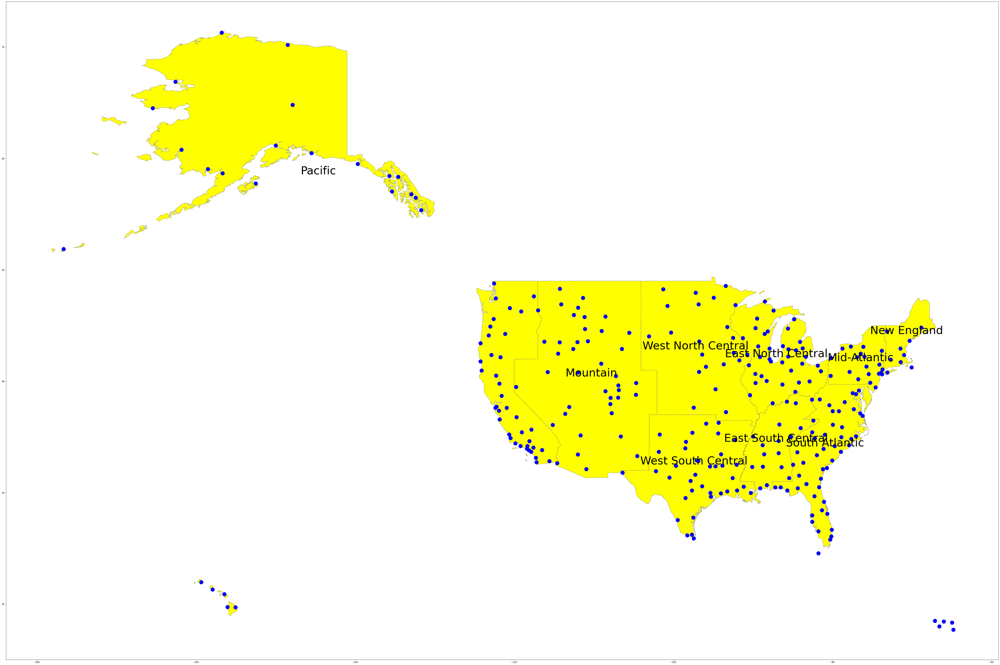

In [18]:
usa_shp = geopandas.read_file('regions/USA_Regions_USCB.shp').set_index('REGN_USCB')
fig, ax = plt.subplots(figsize=(80,80))
usa_shp.to_crs(epsg=4326).plot(ax=ax, color='yellow', edgecolor='grey')
usa_shp = usa_shp.reset_index()
usa_shp.apply(lambda x: ax.annotate(text=x['REGN_USCB'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=50), axis=1)
airport_shp.to_crs(epsg=4326).plot(ax=ax, color='blue', markersize=300)
usa_shp = usa_shp.set_index('REGN_USCB')
plt.show()

In [19]:
display(usa_shp)

,geometry
REGN_USCB,
Pacific,"MULTIPOLYGON (((-155.09895 19.88016, -155.0748..."
Mountain,"POLYGON ((-104.06299 49.00003, -104.05232 48.6..."
New England,"MULTIPOLYGON (((-70.04926 41.39196, -69.96598 ..."
West North Central,"POLYGON ((-94.83204 49.33081, -94.68125 48.877..."
East North Central,"MULTIPOLYGON (((-86.98625 45.29866, -86.96771 ..."
Mid-Atlantic,"MULTIPOLYGON (((-74.19364 40.51056, -74.23694 ..."
South Atlantic,"MULTIPOLYGON (((-80.35567 25.15823, -80.58782 ..."
East South Central,"POLYGON ((-84.74288 39.14206, -84.66749 39.089..."
West South Central,"MULTIPOLYGON (((-97.17205 26.07808, -97.17959 ..."


In [20]:
# A function map Lon and Lat to Region
from pyproj import CRS
crs = CRS('epsg:4326')
def cor2loc(df, lon_var, lat_var):
    local_df = df.copy()
    shape_df = geopandas.read_file('regions/cb_2020_us_division_500k.shp')
    shape_df = shape_df.to_crs(crs)
    
    try:
        local_gdf = geopandas.GeoDataFrame(local_df, crs=crs,
                                          geometry=[Point(xy) for xy in zip(local_df[lon_var], local_df[lat_var])])
        local_gdf = geopandas.sjoin(local_gdf, shape_df, how='left', op='within')
        local_gdf = local_gdf.drop(['AFFGEOID','GEOID','NAMELSAD','LSAD','ALAND','AWATER','index_right','geometry','DIVISIONCE','lat', 'long', 'airport', 'city', 'state','country','iata'], axis=1)
        
        return local_gdf
    except ValueError as ve:
        print(ve)
        print(ve.stacktrace())
        series = df[lon_var]
        return series

In [21]:
airportPds = airport.toPandas()
airport_region = cor2loc(airportPds, 'long', 'lat').fillna('NAN').replace('Middle Atlantic', 'Mid-Atlantic')
airport_region = spark.createDataFrame(airport_region)
airport_region.show(302)

+-------+------------------+
|Airport|              NAME|
+-------+------------------+
|    BGM|      Mid-Atlantic|
|    PSE|               NAN|
|    MSY|West South Central|
|    GEG|           Pacific|
|    BUR|           Pacific|
|    SNA|           Pacific|
|    GRB|East North Central|
|    GTF|          Mountain|
|    IDA|          Mountain|
|    GRR|East North Central|
|    EUG|           Pacific|
|    PSG|           Pacific|
|    PVD|       New England|
|    MYR|    South Atlantic|
|    GSO|    South Atlantic|
|    OAK|           Pacific|
|    MSN|East North Central|
|    COD|          Mountain|
|    FAR|West North Central|
|    BTM|          Mountain|
|    FSM|West South Central|
|    MQT|East North Central|
|    SCC|           Pacific|
|    DCA|    South Atlantic|
|    RFD|East North Central|
|    MLU|West South Central|
|    CID|West North Central|
|    LWS|          Mountain|
|    GTR|East South Central|
|    WRG|           Pacific|
|    HLN|          Mountain|
|    LEX|East 

,REGN_USCB,geometry,count
0,Pacific,"MULTIPOLYGON (((-155.09895 19.88016, -155.0748...",63
1,Mountain,"POLYGON ((-104.06299 49.00003, -104.05232 48.6...",41
2,New England,"MULTIPOLYGON (((-70.04926 41.39196, -69.96598 ...",8
3,West North Central,"POLYGON ((-94.83204 49.33081, -94.68125 48.877...",23
4,East North Central,"MULTIPOLYGON (((-86.98625 45.29866, -86.96771 ...",35
5,Mid-Atlantic,"MULTIPOLYGON (((-74.19364 40.51056, -74.23694 ...",21
6,South Atlantic,"MULTIPOLYGON (((-80.35567 25.15823, -80.58782 ...",50
7,East South Central,"POLYGON ((-84.74288 39.14206, -84.66749 39.089...",18
8,West South Central,"MULTIPOLYGON (((-97.17205 26.07808, -97.17959 ...",38


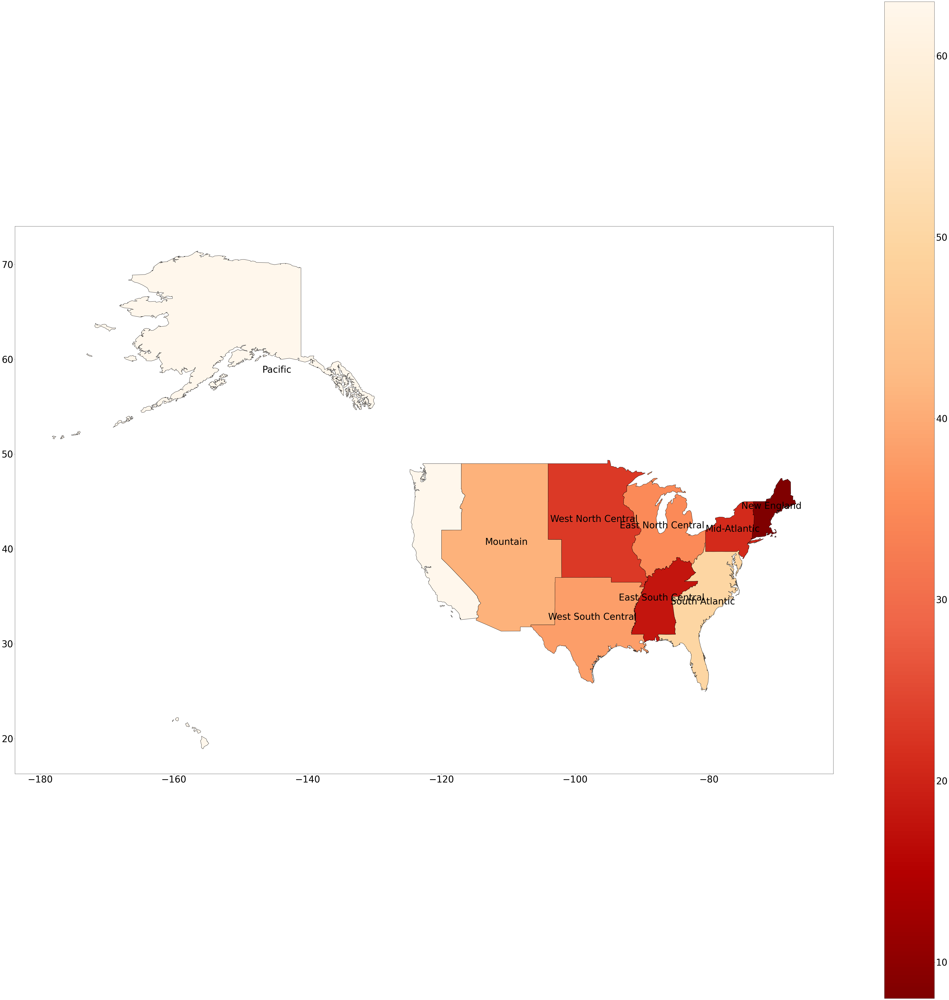

In [22]:
AirportCount = airport_region.groupby('NAME').count().toPandas().set_index('NAME')
new_usa_shp = usa_shp.join(AirportCount)
ax = new_usa_shp.to_crs(epsg=4326).plot(column='count', cmap='OrRd_r', legend=True, edgecolor='black',figsize=(80,80))
new_usa_shp = new_usa_shp.reset_index()
new_usa_shp.apply(lambda x: ax.annotate(text=x['REGN_USCB'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=40), axis=1)
ax.tick_params(labelsize=40)
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=40)
display(new_usa_shp)
plt.show()

,REGN_USCB,geometry,DepAirport
0,Pacific,"MULTIPOLYGON (((-155.09895 19.88016, -155.0748...",8616946
1,Mountain,"POLYGON ((-104.06299 49.00003, -104.05232 48.6...",6279502
2,New England,"MULTIPOLYGON (((-70.04926 41.39196, -69.96598 ...",1771457
3,West North Central,"POLYGON ((-94.83204 49.33081, -94.68125 48.877...",3081804
4,East North Central,"MULTIPOLYGON (((-86.98625 45.29866, -86.96771 ...",6737383
5,Mid-Atlantic,"MULTIPOLYGON (((-74.19364 40.51056, -74.23694 ...",5026787
6,South Atlantic,"MULTIPOLYGON (((-80.35567 25.15823, -80.58782 ...",10655898
7,East South Central,"POLYGON ((-84.74288 39.14206, -84.66749 39.089...",2628872
8,West South Central,"MULTIPOLYGON (((-97.17205 26.07808, -97.17959 ...",7073041


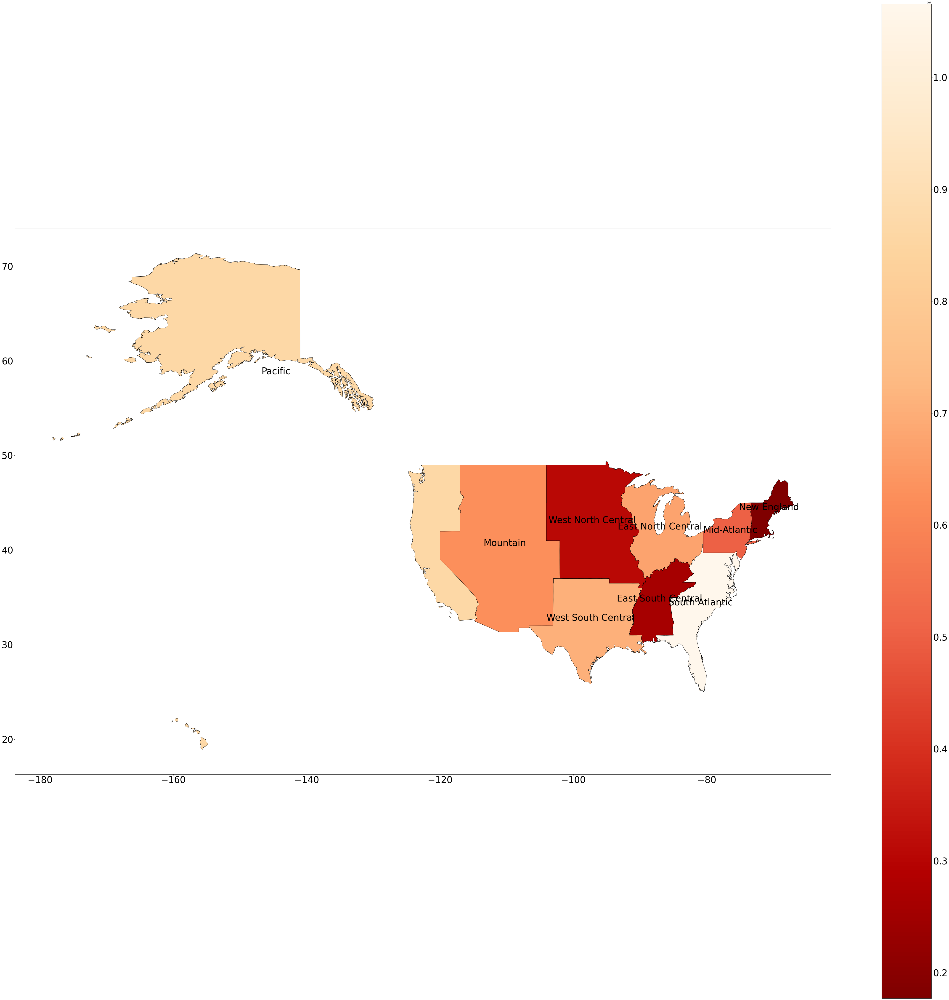

In [23]:
DepCount = df.groupby('Origin').count()
DepCount = DepCount.join(airport_region, DepCount.Origin==airport_region.Airport).drop('Airport')

DepReg_gdf = geopandas.GeoDataFrame(DepCount.groupby('NAME').sum('count').withColumnRenamed('sum(count)', 'DepAirport').toPandas().set_index('NAME'))
DepReg_gdf = DepReg_gdf.astype({'DepAirport':'int32'})
new_usa_shp = usa_shp.join(DepReg_gdf)
ax = new_usa_shp.to_crs(epsg=4326).plot(column='DepAirport', cmap='OrRd_r', legend=True, edgecolor='black',figsize=(80,80))
new_usa_shp = new_usa_shp.reset_index()
display(new_usa_shp)
new_usa_shp.apply(lambda x: ax.annotate(text=x['REGN_USCB'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=40), axis=1)
ax.tick_params(labelsize=40)
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=40)
plt.show()

,geometry,ArrAirport
REGN_USCB,,
Pacific,"MULTIPOLYGON (((-155.09895 19.88016, -155.0748...",8616984
Mountain,"POLYGON ((-104.06299 49.00003, -104.05232 48.6...",6280286
New England,"MULTIPOLYGON (((-70.04926 41.39196, -69.96598 ...",1771523
West North Central,"POLYGON ((-94.83204 49.33081, -94.68125 48.877...",3082281
East North Central,"MULTIPOLYGON (((-86.98625 45.29866, -86.96771 ...",6738310
Mid-Atlantic,"MULTIPOLYGON (((-74.19364 40.51056, -74.23694 ...",5026904
South Atlantic,"MULTIPOLYGON (((-80.35567 25.15823, -80.58782 ...",10651304
East South Central,"POLYGON ((-84.74288 39.14206, -84.66749 39.089...",2629910
West South Central,"MULTIPOLYGON (((-97.17205 26.07808, -97.17959 ...",7074199


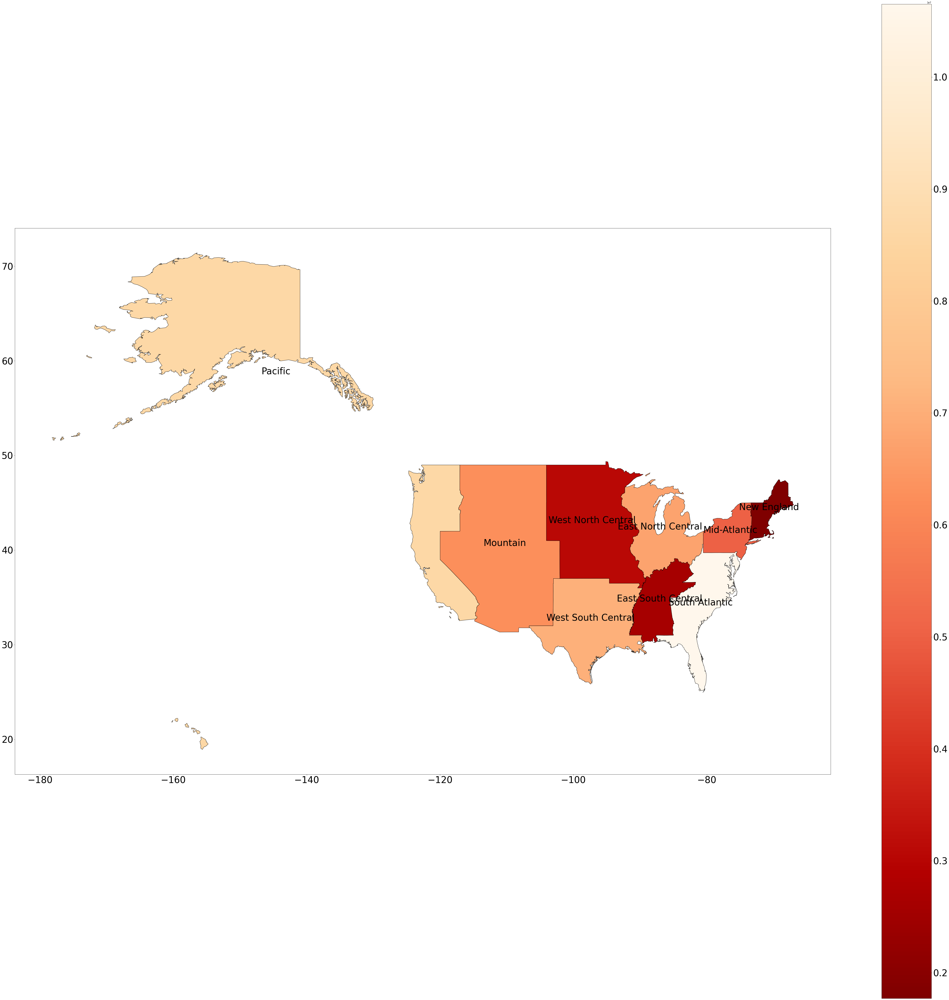

In [24]:
ArrCount = df.groupby('Dest').count()
ArrCount = ArrCount.join(airport_region, ArrCount.Dest==airport_region.Airport).drop('Airport')
ArrReg_gdf = geopandas.GeoDataFrame(ArrCount.groupby('NAME').sum('count').withColumnRenamed('sum(count)', 'ArrAirport').toPandas().set_index('NAME'))
ArrReg_gdf = ArrReg_gdf.astype({'ArrAirport':'int32'})
new_usa_shp = usa_shp.join(ArrReg_gdf)
ax = new_usa_shp.to_crs(epsg=4326).plot(column='ArrAirport', cmap='OrRd_r', legend=True, edgecolor='black',figsize=(80,80))
display(new_usa_shp)
new_usa_shp = new_usa_shp.reset_index()
new_usa_shp.apply(lambda x: ax.annotate(text=x['REGN_USCB'], xy=x.geometry.centroid.coords[0], ha='center', fontsize=40), axis=1)
ax.tick_params(labelsize=40)
fig = ax.figure
cb_ax = fig.axes[1]
cb_ax.tick_params(labelsize=40)
plt.show()

In [25]:
ADCount = df.groupby('Origin', 'Dest').count()
ADCount.sort('count', ascending=False).show(5)
ADCount.sort('count', ascending=True).show(5)

+------+----+------+
|Origin|Dest| count|
+------+----+------+
|   LAX| LAS|109093|
|   LAS| LAX|106940|
|   PHX| LAX| 96218|
|   BOS| LGA| 94869|
|   LAX| PHX| 94726|
+------+----+------+
only showing top 5 rows



+------+----+-----+
|Origin|Dest|count|
+------+----+-----+
|   FAT| OGD|    1|
|   MFR| MOD|    1|
|   LGB| GEG|    1|
|   PIA| LNK|    1|
|   FSD| GRB|    1|
+------+----+-----+
only showing top 5 rows



In [26]:
ADCount.count()

7290

In [27]:
myType = [StructField('iata', StringType(),True),
      StructField('airport', StringType(),True),
      StructField('city', StringType(),True),
      StructField('state', StringType(),True),
      StructField('country', StringType(),True),
      StructField('lat', FloatType(),True),
      StructField('long', FloatType(),True)
]
struct = StructType(fields=myType)
airport = spark.read.option('header',True).csv('./airports.csv', sep=',', schema=struct)
airport = airport.select('iata', 'lat', 'long')


mapping = ADCount.join(airport, ADCount.Origin==airport.iata, how='inner').drop('iata')
mapping = mapping.withColumnRenamed('lat', 'StartLat').withColumnRenamed('long', 'StartLong')
mapping = mapping.join(airport, ADCount.Dest==airport.iata, how='inner').drop('iata')
mapping = mapping.withColumnRenamed('lat', 'EndLat').withColumnRenamed('long', 'EndLong')
mapping.show()

+------+----+-----+---------+-----------+---------+-----------+
|Origin|Dest|count| StartLat|  StartLong|   EndLat|    EndLong|
+------+----+-----+---------+-----------+---------+-----------+
|   LAS| LIT| 2545| 36.08036|-115.152336|34.729397|  -92.22424|
|   PHL| MCO|40482|39.871952|  -75.24114|28.428888| -81.316025|
|   SMF| BUR|27488|38.695423| -121.59077| 34.20062|  -118.3585|
|   SNA| PHX|34265| 33.67566|-117.868225|33.434166| -112.00806|
|   MCI| IAH|15917|39.297604| -94.713905|29.980473|  -95.33972|
|   BFL| SAN|  575|35.433598| -119.05677|32.733555| -117.18966|
|   ROC| CLE| 4696|43.118866| -77.672386|41.410892| -81.849396|
|   SPI| ORD| 2876|39.843952|  -89.67762|41.979595| -87.904465|
|   ATL| GSP|20006|33.640446|  -84.42694|34.895668|  -82.21886|
|   LAX| OXR| 7855|33.942535| -118.40807|  34.2008|-119.207214|
|   SFO| PMD| 1119|37.619003| -122.37484| 34.62939| -118.08456|
|   ORD| PDX|22891|41.979595| -87.904465|45.588722|  -122.5975|
|   PBI| DCA| 6934|26.683163|   -80.0956

In [51]:
from shapely.geometry import LineString
mapping_pds = mapping.toPandas()
geometry = [LineString([[mapping_pds.iloc[i]['StartLong'], mapping_pds.iloc[i]['StartLat']], [mapping_pds.iloc[i]['EndLong'], mapping_pds.iloc[i]['EndLat']]]) for i in range(mapping_pds.shape[0])]
routes = geopandas.GeoDataFrame(mapping_pds, geometry=geometry, crs='EPSG:4326')
display(routes)

,Origin,Dest,count,StartLat,StartLong,EndLat,EndLong,geometry
0,LAS,LIT,2545,36.080360,-115.152336,34.729397,-92.224243,"LINESTRING (-115.15234 36.08036, -92.22424 34...."
1,PHL,MCO,40482,39.871952,-75.241142,28.428888,-81.316025,"LINESTRING (-75.24114 39.87195, -81.31602 28.4..."
2,SMF,BUR,27488,38.695423,-121.590767,34.200619,-118.358498,"LINESTRING (-121.59077 38.69542, -118.35850 34..."
3,SNA,PHX,34265,33.675659,-117.868225,33.434166,-112.008057,"LINESTRING (-117.86823 33.67566, -112.00806 33..."
4,MCI,IAH,15917,39.297604,-94.713905,29.980473,-95.339722,"LINESTRING (-94.71391 39.29760, -95.33972 29.9..."
...,...,...,...,...,...,...,...,...
7284,TUL,SNA,1,36.198372,-95.888245,33.675659,-117.868225,"LINESTRING (-95.88824 36.19837, -117.86823 33...."
7285,ICT,DAY,1,37.649960,-97.433044,39.902374,-84.219376,"LINESTRING (-97.43304 37.64996, -84.21938 39.9..."
7286,FSD,CLT,1,43.581352,-96.741699,35.214012,-80.943123,"LINESTRING (-96.74170 43.58135, -80.94312 35.2..."
7287,CMI,SPI,1,40.039249,-88.278053,39.843952,-89.677620,"LINESTRING (-88.27805 40.03925, -89.67762 39.8..."


In [29]:
usa_shp = geopandas.read_file('regions/USA_Regions_USCB.shp').set_index('REGN_USCB')
fig, ax = plt.subplots(figsize=(200,200))
usa_shp.to_crs(epsg=4326).plot(ax=ax, color='yellow', edgecolor='grey')
airport_shp.to_crs(epsg=4326).plot(ax=ax, color='blue', markersize=300)
ax.patch.set_facecolor('black')
routes.plot(ax=ax, color='gray', linewidth=routes['count'])
plt.show()

In [58]:
top = routes.sort_values(by='count', ascending=False).nlargest(10, 'count')
display(top.groupby('count').count().sort_values(by='count', ascending=False))
fig, ax = plt.subplots(figsize=(200,200))
usa_shp.to_crs(epsg=4326).plot(ax=ax, color='yellow', edgecolor='grey')
airport_shp.to_crs(epsg=4326).plot(ax=ax, color='blue', markersize=300)
ax.patch.set_facecolor('black')
top.plot(ax=ax, color='Red', linewidth=30)
display(top)
plt.show()

,Origin,Dest,StartLat,StartLong,EndLat,EndLong,geometry
count,,,,,,,
109093,1,1,1,1,1,1,1
106940,1,1,1,1,1,1,1
96218,1,1,1,1,1,1,1
94869,1,1,1,1,1,1,1
94726,1,1,1,1,1,1,1
94339,1,1,1,1,1,1,1
93594,1,1,1,1,1,1,1
93557,1,1,1,1,1,1,1
91771,1,1,1,1,1,1,1


,Origin,Dest,count,StartLat,StartLong,EndLat,EndLong,geometry
5666,LAX,LAS,109093,33.942535,-118.408073,36.080360,-115.152336,"LINESTRING (-118.40807 33.94254, -115.15234 36..."
4687,LAS,LAX,106940,36.080360,-115.152336,33.942535,-118.408073,"LINESTRING (-115.15234 36.08036, -118.40807 33..."
4843,PHX,LAX,96218,33.434166,-112.008057,33.942535,-118.408073,"LINESTRING (-112.00806 33.43417, -118.40807 33..."
3322,BOS,LGA,94869,42.364349,-71.005180,40.777245,-73.872612,"LINESTRING (-71.00518 42.36435, -73.87261 40.7..."
2611,LAX,PHX,94726,33.942535,-118.408073,33.434166,-112.008057,"LINESTRING (-118.40807 33.94254, -112.00806 33..."
6247,LGA,BOS,94339,40.777245,-73.872612,42.364349,-71.005180,"LINESTRING (-73.87261 40.77724, -71.00518 42.3..."
3283,SAN,LAX,93594,32.733555,-117.189659,33.942535,-118.408073,"LINESTRING (-117.18966 32.73355, -118.40807 33..."
5152,LAX,SAN,93557,33.942535,-118.408073,32.733555,-117.189659,"LINESTRING (-118.40807 33.94254, -117.18966 32..."
1248,LAS,PHX,91771,36.080360,-115.152336,33.434166,-112.008057,"LINESTRING (-115.15234 36.08036, -112.00806 33..."
5209,SFO,LAX,91653,37.619003,-122.374840,33.942535,-118.408073,"LINESTRING (-122.37484 37.61900, -118.40807 33..."


In [59]:
top = routes.sort_values(by='count', ascending=False).nlargest(20, 'count')
display(top.groupby('count').count().sort_values(by='count', ascending=False))
fig, ax = plt.subplots(figsize=(200,200))
usa_shp.to_crs(epsg=4326).plot(ax=ax, color='yellow', edgecolor='grey')
airport_shp.to_crs(epsg=4326).plot(ax=ax, color='blue', markersize=300)
ax.patch.set_facecolor('black')
top.plot(ax=ax, color='Red', linewidth=30)
display(top)
plt.show()

,Origin,Dest,StartLat,StartLong,EndLat,EndLong,geometry
count,,,,,,,
109093,1,1,1,1,1,1,1
106940,1,1,1,1,1,1,1
96218,1,1,1,1,1,1,1
94869,1,1,1,1,1,1,1
94726,1,1,1,1,1,1,1
94339,1,1,1,1,1,1,1
93594,1,1,1,1,1,1,1
93557,1,1,1,1,1,1,1
91771,1,1,1,1,1,1,1


,Origin,Dest,count,StartLat,StartLong,EndLat,EndLong,geometry
5666,LAX,LAS,109093,33.942535,-118.408073,36.080360,-115.152336,"LINESTRING (-118.40807 33.94254, -115.15234 36..."
4687,LAS,LAX,106940,36.080360,-115.152336,33.942535,-118.408073,"LINESTRING (-115.15234 36.08036, -118.40807 33..."
4843,PHX,LAX,96218,33.434166,-112.008057,33.942535,-118.408073,"LINESTRING (-112.00806 33.43417, -118.40807 33..."
3322,BOS,LGA,94869,42.364349,-71.005180,40.777245,-73.872612,"LINESTRING (-71.00518 42.36435, -73.87261 40.7..."
2611,LAX,PHX,94726,33.942535,-118.408073,33.434166,-112.008057,"LINESTRING (-118.40807 33.94254, -112.00806 33..."
6247,LGA,BOS,94339,40.777245,-73.872612,42.364349,-71.005180,"LINESTRING (-73.87261 40.77724, -71.00518 42.3..."
3283,SAN,LAX,93594,32.733555,-117.189659,33.942535,-118.408073,"LINESTRING (-117.18966 32.73355, -118.40807 33..."
5152,LAX,SAN,93557,33.942535,-118.408073,32.733555,-117.189659,"LINESTRING (-118.40807 33.94254, -117.18966 32..."
1248,LAS,PHX,91771,36.080360,-115.152336,33.434166,-112.008057,"LINESTRING (-115.15234 36.08036, -112.00806 33..."
5209,SFO,LAX,91653,37.619003,-122.374840,33.942535,-118.408073,"LINESTRING (-122.37484 37.61900, -118.40807 33..."


In [60]:
top = routes.sort_values(by='count', ascending=False).nlargest(100, 'count')
display(top.groupby('count').count().sort_values(by='count', ascending=False))
fig, ax = plt.subplots(figsize=(200,200))
usa_shp.to_crs(epsg=4326).plot(ax=ax, color='yellow', edgecolor='grey')
airport_shp.to_crs(epsg=4326).plot(ax=ax, color='blue', markersize=300)
ax.patch.set_facecolor('black')
top.plot(ax=ax, color='Red', linewidth=30)
plt.show()

,Origin,Dest,StartLat,StartLong,EndLat,EndLong,geometry
count,,,,,,,
109093,1,1,1,1,1,1,1
106940,1,1,1,1,1,1,1
96218,1,1,1,1,1,1,1
94869,1,1,1,1,1,1,1
94726,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...
47968,1,1,1,1,1,1,1
47932,1,1,1,1,1,1,1
47758,1,1,1,1,1,1,1


In [63]:
top = routes.sort_values(by='count', ascending=False).nsmallest(837, 'count')
display(top.groupby('count').count().sort_values(by='count', ascending=False))
fig, ax = plt.subplots(figsize=(200,200))
usa_shp.to_crs(epsg=4326).plot(ax=ax, color='yellow', edgecolor='grey')
airport_shp.to_crs(epsg=4326).plot(ax=ax, color='blue', markersize=300)
ax.patch.set_facecolor('black')
top.plot(ax=ax, color='Red', linewidth=30)
plt.show()

,Origin,Dest,StartLat,StartLong,EndLat,EndLong,geometry
count,,,,,,,
1,837,837,837,837,837,837,837
